#### Unsupervised Settings of UNet

model will learn the road scenes directly from the normalized (/256) input images

no annotation is required. averaged pixel prediction loss will be applied.

In [1]:
import sys, os
sys.path.append('/work/model/')

from head.convnext_se_unet import Encoder, DBlock, DStage, DStemNx, DStemStacked, DStemStaged, Decoder, UNet
from utils.conv_2d import adjust_padding_for_strided_output, DepthWiseSepConv
from utils.stochastic_depth_drop import create_linear_p, create_uniform_p

import os
import glob
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import regex as re
from tqdm import tqdm
import time
import logging

import torch
import torch.nn as nn
import torchvision
from torchvision.transforms import v2
import torchinfo
import albumentations as A
from albumentations.pytorch import ToTensorV2

import sklearn
import sklearn.metrics as metrics
import timm.scheduler

import datetime

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.23). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
#########################################################
################# initialize encoder ####################
#########################################################
dp_list, dp_mode = create_linear_p([3,3,6,3], 'batch', 0.1) # creates linearly decaying stochastic depth drop probability
# dp_list, dp_mode = create_uniform_p([3,3,9,3], 'batch', 0.001) # create constant stochastic depth drop probability
    
unet_encoder = Encoder(num_blocks=[3,3,6,3], input_channels=3, stem_kersz=(4,4), stem_stride=(4,4), img_hw=[(56, 168), (28, 84), (14, 42), (7,21)], main_channels=[48, 96, 192, 384], expansion_dim=[48*4, 96*4, 192*4, 384*4],
                               kernel_sz=[(7,7),(7,7),(7,7),(7,7)], stride=[(1,1),(1,1),(1,1),(1,1)], padding=['same', 'same', 'same', 'same'], dilation=[1,1,1,1], groups=[1,1,1,1], droprate=dp_list, drop_mode=dp_mode,
                               use_se=[True, True, True, True], squeeze_ratio=16, transition_kersz=[-1, (2,2),(2,2),(2,2)], transition_stride=[-1, (2,2), (2,2), (2,2)], norm_mode='layer_norm', device='cuda')

############################################################
################# intialize decoder & head #################
############################################################

# class DStem4x(torch.nn.Module):
#     def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0, output_padding=0, groups=1,
#                  dilation=1, device='cuda'):

# class DStemStacked(torch.nn.Module):
#     def __init__(self, in_channels:list, out_channels:list, kernel_size:list, stride:list, padding:list, output_padding:list, groups:list,
#                  dilation:list, device):

# class DStemStaged(torch.nn.ModuleList):
#     def __init__(self, num_blocks:list, img_hw:list, input_channels, main_channels, expansion_channels, kernel_sz, stride, padding, dilation, groups, droprate, drop_mode,
#                  use_se, squeeze_ratio, transition_kersz, transition_stride, transition_padding, transition_out_padding, device='cuda'):

# head_4x = DStemNx(in_channels=96, out_channels=128, kernel_size=(16, 24), stride=(8, 16), padding=(1,0), output_padding=(0,0), groups=1, dilation=1, device='cuda')
# head_stack = DStemStacked(in_channels=[96, 128], out_channels=[128, 256], kernel_size=[(4,4), (12,12)], stride=[(2,4), (4,4)], padding=[(1,0), (1,0)], output_padding=[(0,0), (0,0)], 
#                           groups=[1,1], dilation=[1,1], device='cuda')

# droprate, drop_mode = create_linear_p([2,2,2,2,1], dp_mode='batch', last_p=0.25)
# head_stage = DStemStaged(num_blocks=[2, 1], img_hw=[(112, 336), (224, 672)], input_channels=48, main_channels=[48, 48], expansion_channels=[48*4, 48*4],
#                          kernel_sz=[(7,7), (7,7)], stride=[(1,1), (1,1)], padding=['same', 'same'], dilation=[1, 1], groups=[1,1], 
#                          droprate=droprate[3:], drop_mode=drop_mode[3:],
#                          use_se=[True, True], squeeze_ratio=16, transition_kersz=[(7,7)]*2, transition_stride=[(2,2)]*2, transition_padding=[(3,3)]*2,
#                          transition_out_padding=[(1,1)]*2, norm_mode='layer_norm', device='cuda')

droprate, drop_mode = create_linear_p([2,2,2], dp_mode='batch', last_p=0.1)
head_4x = DStemNx(in_channels=96, out_channels=48, kernel_size=(4,4), stride=(4,4), padding=(0,0), output_padding=(0,0), groups=1, dilation=1, device='cuda')
unet_decoder = Decoder(num_blocks=[2,2,2], img_hw=[(14, 42), (28, 84), (56, 168)], main_channels=[384, 192, 96], expansion_dim=[384*4, 192*4, 96*4],
                  kernel_sz=[(7,7)]*3, stride=[(1,1)]*3, padding=['same']*3, dilation=[1]*3, groups=[1]*3, droprate=droprate, drop_mode=drop_mode,
                  use_se=[True]*3, squeeze_ratio=16, encoder_channels=[384, 192, 96, 48], transition_kersz=[(7,7)]*3, transition_stride=[(2,2)]*3,
                  transition_padding=[(3,3)]*3, transition_out_padding=[(1,1)]*3, norm_mode='layer_norm', head=head_4x, device='cuda')

############################################################
################# intialize unet model #####################
############################################################
# to predict RGB image (3 channels), model output will be num_cls=3 channels
# output_mode will be 'logits' instead of 'probs' because direct regression to normalized image pixel will be applied.
convnext_unet = UNet(encoder=unet_encoder, decoder=unet_decoder, num_cls=3, output_mode='logits')
torchinfo.summary(convnext_unet, (1, 3, 224, 672)) # in case of DStem4x as decoder head, parameter size is 71,424,785 (convnext tiny size, symmetric decoder design with light head)
convnext_unet = convnext_unet.to('cpu') # to save gpu memory

### Load All train, val data from CULane. You can also tried other lane-detection datatset, etc. BDD100K, LLAMAS


#### unsupervised learning data usage:

only train set of CULane will be sampled from CULane dataset. (validation, test set will leak the information)

all train, test set of LLAMAS, Tusimple, BDD100K will be sampled from LLAMAS, Tusimple, BDD100K dataset. in case of validation, only part of it will be sampled to monitor the unsupervised training process.

consider the number of validation image ratio between Tusimple, BDD100K, LLAMAS, CULane dataset

#### pre-task self-supervsied learning data usage:

similar to above unsupervised scheme but does not use test dataset because it does not have labels for supervised learning

integrity between datasets is different with each other. preprocess to combine all the dataset in uniform.

In [8]:
# load CULane images (in case of culane, test set labels are not publicly available)
CULANE_PATH='/work/dataset/CULane'
with open(CULANE_PATH+'/list/train_gt.txt', 'r') as fr:
    cu_train_info = fr.readlines()
with open(CULANE_PATH+'/list/val_gt.txt', 'r') as fr:
    cu_val_info = fr.readlines() # this will be used as validation set of unsupervised learning
with open(CULANE_PATH + '/list/test.txt', 'r') as fr:
    cu_test_info = fr.readlines()

# in case of culane, 30 frames per images
cu_train_x = []
cu_train_y = []
cu_val_x = []
cu_val_y = []
cu_test_x = []

for path in cu_train_info:
    tokens = path.split(' ')
    cu_train_x.append(CULANE_PATH+tokens[0])
    cu_train_y.append(CULANE_PATH+tokens[1])
    
for path in cu_val_info:
    tokens = path.split(' ')
    cu_val_x.append(CULANE_PATH+tokens[0]) # 9675
    cu_val_y.append(CULANE_PATH+tokens[1])

for path in cu_test_info:
    tokens = path.split(' ')
    cu_test_x.append(CULANE_PATH+tokens[0])

# load Tusimple images (in case of tusimple, test set labels are available)
TUSIMPLE_PATH='/work/dataset/Tusimple'
with open(TUSIMPLE_PATH+'/train_set/seg_label/list/train_val_gt.txt', 'r') as fr:
    tu_trainval_info = fr.readlines()
with open(TUSIMPLE_PATH+'/train_set/seg_label/list/test_gt.txt', 'r') as fr:
    tu_test_info = fr.readlines()

tu_trainval_x = []
tu_trainval_y = []
tu_test_x = []
tu_test_y = []

for path in tu_trainval_info:
    tokens = path.split(' ')
    tu_trainval_x.append(TUSIMPLE_PATH+ '/train_set' + tokens[0])
    tu_trainval_y.append(TUSIMPLE_PATH+ '/train_set' + tokens[1])

for path in tu_test_info:
    tokens = path.split(' ')
    tu_test_x.append(TUSIMPLE_PATH+ '/test_set' + tokens[0]) # images must be the images in test set.
    tu_test_y.append(TUSIMPLE_PATH+ '/train_set' + tokens[1])  # segmentation labels are in the /train_set folder.

# load LLAMAS images (in case of llamas labels for test set are not publicly available)
LLAMAS_PATH='/work/dataset/LLAMAS'
llamas_train_x = glob.glob(LLAMAS_PATH+'/color_images/train/*/*.png')
llamas_val_x = glob.glob(LLAMAS_PATH + '/color_images/valid/*/*.png')
llamas_test_x = glob.glob(LLAMAS_PATH + '/color_images/test/*/*.png')

llamas_train_y = glob.glob(LLAMAS_PATH+'/labels/train/*/*.png')
llamas_val_y = glob.glob(LLAMAS_PATH+ '/labels/valid/*/*.png')

llamas_train_x = sorted(llamas_train_x)
llamas_val_x = sorted(llamas_val_x)
llamas_train_y = sorted(llamas_train_y)
llamas_val_y = sorted(llamas_val_y)

In [9]:
# load BDD100K images (BDD100K does not have test set labels)
BDD100K_PATH='/work/dataset/BDD100K'
bdd_train_x = glob.glob(BDD100K_PATH+'/images/100k/train/*.jpg')
bdd_test_x = glob.glob(BDD100K_PATH+ '/images/100k/test/*.jpg')
bdd_val_x = glob.glob(BDD100K_PATH+'/images/100k/val/*.jpg')

# bdd_train_y = glob.glob(BDD100K_PATH+'/labels/lane/masks/train/*.png') # (H, W) format
# bdd_val_y = glob.glob(BDD100K_PATH+'/labels/lane/masks/val/*.png')

bdd_train_y = glob.glob(BDD100K_PATH+'/labels/lane/colormaps/train/*.png') # (H, W, C) format -> visualizable
bdd_val_y = glob.glob(BDD100K_PATH+'/labels/lane/colormaps/val/*.png')

bdd_train_x = sorted(bdd_train_x)
bdd_val_x = sorted(bdd_val_x)
bdd_test_x = sorted(bdd_test_x)

bdd_train_y = sorted(bdd_train_y)
bdd_val_y = sorted(bdd_val_y)

In [10]:
print("number of bdd100k examples: ", len(bdd_train_x))
print("number of bdd100k masks: ", len(bdd_train_y))

number of bdd100k examples:  70000
number of bdd100k masks:  70000


In [11]:
print("number of images for culane train: ", len(cu_train_x))
print("number of images for culane val: ", len(cu_val_x))
print("number of images for culane test: ", len(cu_test_x))
print()
print("number of images for tusimple trainval: ", len(tu_trainval_x))
print("number of images for tusimple test: ", len(tu_test_x))
print()
print("number of images for llamas train: ", len(llamas_train_x))
print("number of images for llamas val: ", len(llamas_val_x))
print("number of images for llamas test: ", len(llamas_test_x))
print()

print("number of images for bdd100k train: ", len(bdd_train_x))
print("number of images for bdd100k val: ", len(bdd_val_x))
print("number of images for bdd100k test: ", len(bdd_test_x))
print()

def check_integrity(x, y):
    if len(x)!=len(y):
        print("number of images and labels are different!")
        return False
    return True

if check_integrity(cu_train_x, cu_train_y):
    print("pass integrity check: culane train")
if check_integrity(cu_val_x, cu_val_y):
    print("pass integrity check: culane val")
    
if check_integrity(tu_trainval_x, tu_trainval_y):
    print("pass integrity check: tusimple trainval")
    
if check_integrity(tu_test_x, tu_test_y):
    print("pass integrity check: tusimple test")
    
if check_integrity(llamas_train_x, llamas_train_y):
    print("pass integrity check: llamas train")
    
if check_integrity(llamas_val_x, llamas_val_y):
    print("pass integrity check: llamas val")
    
if check_integrity(bdd_train_x, bdd_train_y):
    print("pass integrity check: bdd100k train")
    
if check_integrity(bdd_val_x, bdd_val_y):
    print("pass integrity check: bdd100k val")

number of images for culane train:  88880
number of images for culane val:  9675
number of images for culane test:  34680

number of images for tusimple trainval:  3626
number of images for tusimple test:  2782

number of images for llamas train:  58269
number of images for llamas val:  20844
number of images for llamas test:  20929

number of images for bdd100k train:  70000
number of images for bdd100k val:  10000
number of images for bdd100k test:  20000

pass integrity check: culane train
pass integrity check: culane val
pass integrity check: tusimple trainval
pass integrity check: tusimple test
pass integrity check: llamas train
pass integrity check: llamas val
pass integrity check: bdd100k train
pass integrity check: bdd100k val


#### data visualization

visualize images, labels for culane, tusimple, llamas, bdd100k dataset

In [12]:
COLOR_LIST = [(255, 0, 0), (0, 255, 0), (0, 0, 255), 
              (255, 255, 0), (255, 0, 255), (0, 255, 255),
              (255, 255, 255)]

def apply_mask_on_image(image, mask, mode='culane'):
    
    if mode=='culane':
        mask = np.array(mask)
    elif mode=='llamas' or mode=='tusimple':
        mask = np.array(mask)
        mask = np.max(mask, axis=2)
    elif mode=='bdd100k':
        mask = mask.convert('RGB')
        mask = np.array(mask)
        mask = np.max(mask, axis=2)
    else:
        raise Exception("mode must be either culane, llamas, bdd100k, tusimple!")
    
    image = np.array(image)
    
    H, W = mask.shape
    for i in range(H):
        for j in range(W):
            if mask[i, j] > 0:
                image[i, j, :] = np.array(list(COLOR_LIST[(mask[i, j]-1)%len(COLOR_LIST)])).reshape(1, 1, 3) # reshape to point pixel which has 3 channels
            
    return image

culane image shape:  (1640, 590)


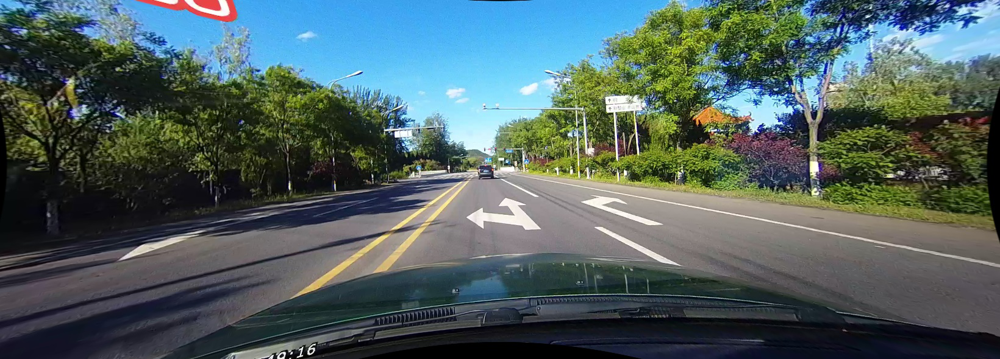

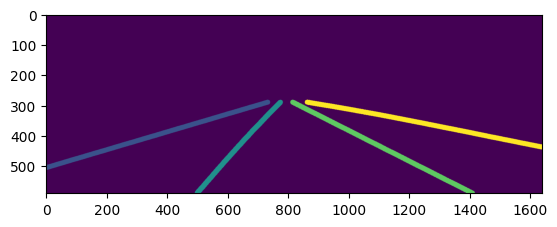

In [13]:
vis_culane = Image.open(cu_train_x[0])
vis_culane_mask = Image.open(cu_train_y[0])

print("culane image shape: ", vis_culane.size) # (H, W) form
vis_culane.show() # visualize images

vis_culane_mask_ = np.array(vis_culane_mask) # visualize masks
plt.imshow(vis_culane_mask_)

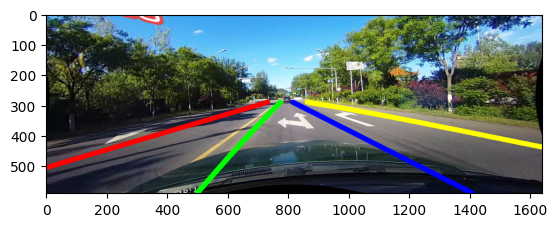

In [14]:
plt.imshow(apply_mask_on_image(vis_culane, vis_culane_mask))

llamas image shape:  (1276, 717)


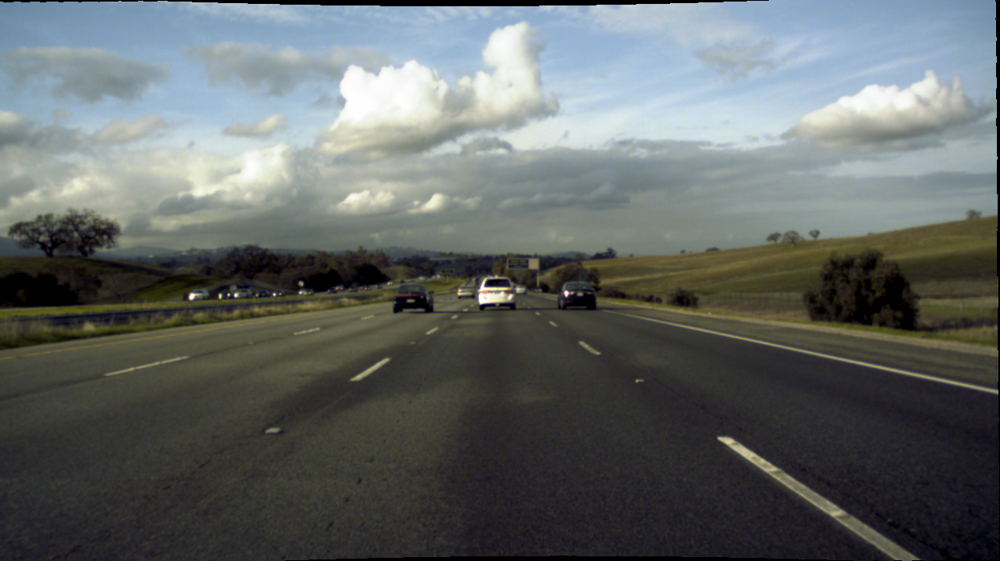

mask shape:  (717, 1276)


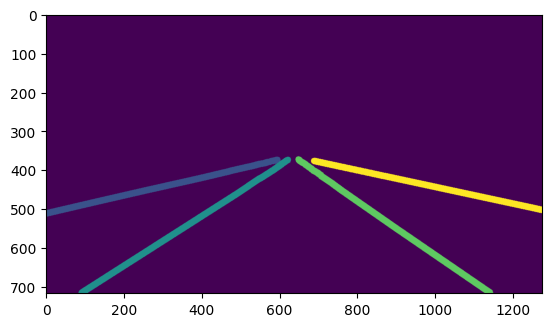

In [15]:
vis_llamas = Image.open(llamas_train_x[4])
vis_llamas_mask = Image.open(llamas_train_y[4])
vis_llamas_mask_ = np.array(vis_llamas_mask)

print("llamas image shape: ", vis_llamas.size) # (W, H) format
vis_llamas.show()
vis_llamas_mask_ = np.max(vis_llamas_mask_, axis=2)

plt.imshow(vis_llamas_mask_)
print("mask shape: ", vis_llamas_mask_.shape)

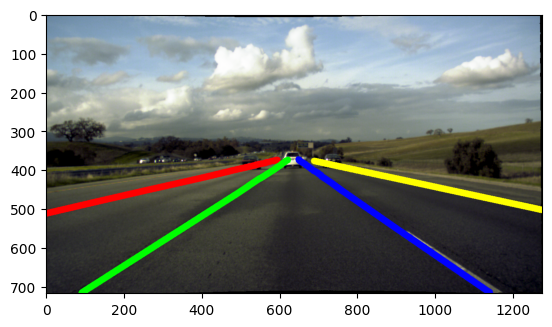

In [16]:
plt.imshow(apply_mask_on_image(vis_llamas, vis_llamas_mask, mode='llamas'))

tusimple image shape:  (1280, 720)


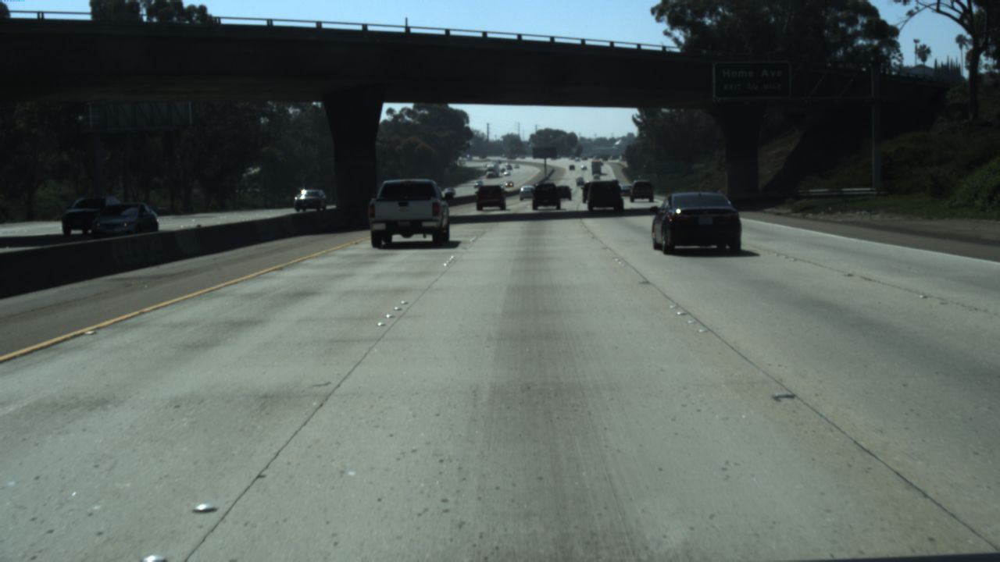

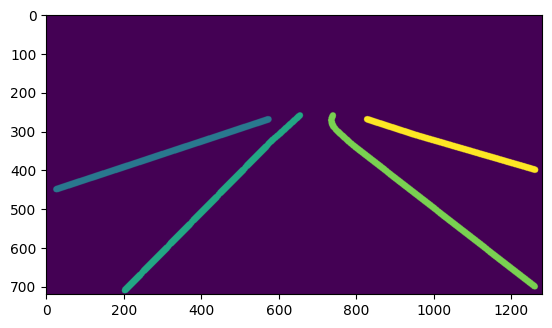

In [17]:
vis_tusimple = Image.open(tu_trainval_x[12])
vis_tusimple_mask = Image.open(tu_trainval_y[12])
vis_tusimple_mask_ = np.array(vis_tusimple_mask)

print("tusimple image shape: ", vis_tusimple.size) # (W, H) form
vis_tusimple.show()

vis_tusimple_mask_ = np.max(vis_tusimple_mask_, axis=2)
plt.imshow(vis_tusimple_mask_)

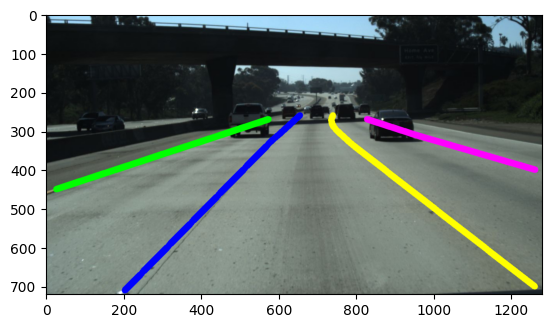

In [18]:
plt.imshow(apply_mask_on_image(vis_tusimple, vis_tusimple_mask, mode='tusimple'))

bdd100k image shape:  (1280, 720)


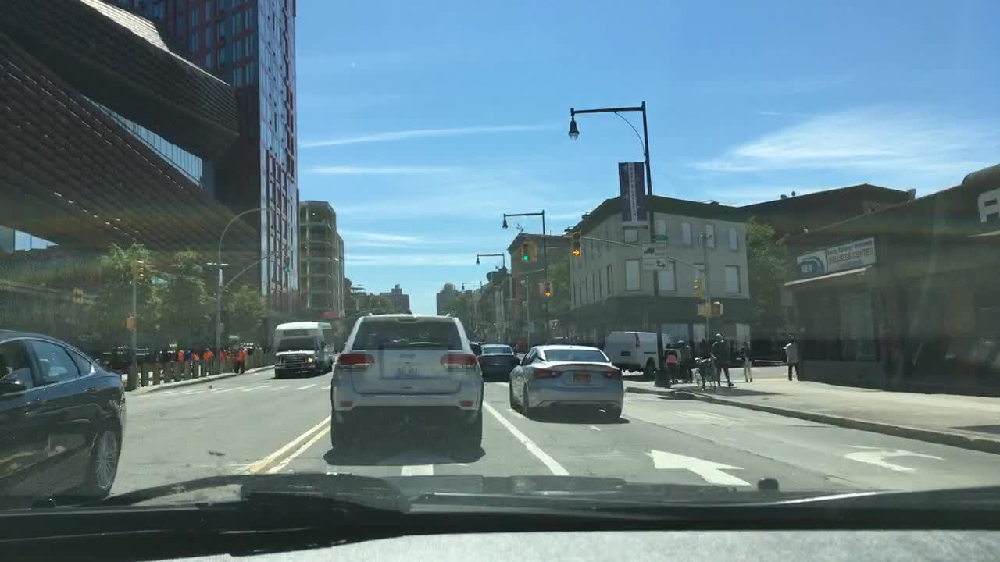

unique values in mask:  [  0 219]
bdd100k mask shape:  (720, 1280)


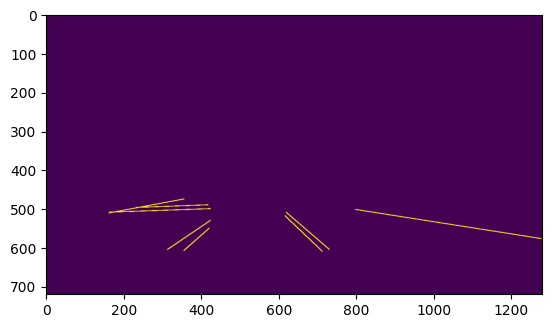

In [19]:
# in case of bdd100k dataset, there is no documentation available rightnow.
# instead of printing every class separately, we'll treat them as binary classification task.
vis_bdd = Image.open(bdd_train_x[60])
vis_bdd_mask = Image.open(bdd_train_y[60])
vis_bdd_mask = vis_bdd_mask.convert('RGB')
vis_bdd_mask = np.array(vis_bdd_mask)
vis_bdd_mask = np.max(vis_bdd_mask, axis=2) # H, W, C format

print("bdd100k image shape: ", vis_bdd.size) # (W, H) form
vis_bdd.show()

print("unique values in mask: ", np.unique(vis_bdd_mask))

# vis_bdd_mask_ = np.abs(vis_bdd_mask-255) # reverse values of pixel spaces 
# plt.imshow(vis_bdd_mask_)
plt.imshow(vis_bdd_mask)
print("bdd100k mask shape: ", vis_bdd_mask.shape)

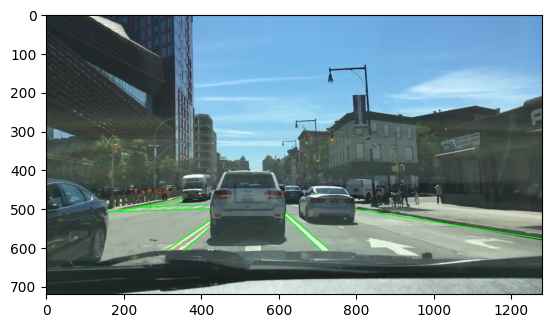

In [20]:
vis_bdd_mask = Image.open(bdd_train_y[60])
plt.imshow(apply_mask_on_image(vis_bdd, vis_bdd_mask, mode='bdd100k'))

#### Model Output Shape Checking

we need to check whether model restore image size as given input!

but as convnext use layer_normalization, we need to fix the input image size for all dataset. -> currently all image size will be fixed during training..

but if other model is used multi-scale, multi-aspect-ratio training can be considered. also in this case consider
the case input!=output, as pytorch transposed convolution does not always upscale image size to n times

In [41]:
culane_path = cu_train_x[0]
culane_ex = Image.open(culane_path)
print("culane size: ", culane_ex.size)
culane_size_transforms = A.Compose([
    A.Resize(224, 672), # 2.63, 2.44 downsized ratio for each H, W
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])
culane_ex_resized = culane_size_transforms(image=np.array(culane_ex))['image'].unsqueeze(0) # add batch dim
print("culane_ex_resized.shape: ", culane_ex_resized.shape)
culane_output = convnext_unet(culane_ex_resized)
print("culane_output.shape: ", culane_output.shape)


llamas_path = llamas_train_x[0]
llamas_ex = Image.open(llamas_path)
print("llamas size: ", llamas_ex.size)
llamas_size_transforms = A.Compose([
    A.Resize(224, 672), # 2.63, 2.44 downsized ratio for each H, W
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])
llamas_ex_resized = llamas_size_transforms(image=np.array(llamas_ex))['image'].unsqueeze(0) # add batch dim
print("llamas_ex_resized.shape: ", llamas_ex_resized.shape)
llamas_output = convnext_unet(llamas_ex_resized)
print("llamas_output.shape: ", llamas_output.shape)


tusimple_path = tu_trainval_x[0]
tusimple_ex = Image.open(tusimple_path)
print("tusimple size: ", tusimple_ex.size)
tusimple_size_transforms = A.Compose([
    A.Resize(224, 672)
])
tusimple_ex_resized = tusimple_size_transforms(image=np.array(tusimple_ex))['image']
tusimple_output = convnext_unet(tusimple_ex_resized)
print("tusimple_output.shape: ", tusimple_output.shape)

bdd_path = bdd_train_x[0]
bdd_ex = Image.open(bdd_path)
print("bdd100k size: ", bdd_ex.size)
bdd_size_transforms = A.Compose([
    A.Resize(224, 672)
])
bdd_ex_resized = bdd_size_transforms(image=np.array(bdd_ex))['image']
bdd_output = convnext_unet(bdd_ex_resized)
print("bdd_output.shape: ", bdd_output.shape)


culane size:  (1640, 590)
culane_ex_resized.shape:  torch.Size([1, 3, 224, 672])
culane_output.shape:  torch.Size([1, 3, 224, 672])
llamas size:  (1276, 717)
llamas_ex_resized.shape:  torch.Size([1, 3, 224, 672])
llamas_output.shape:  torch.Size([1, 3, 224, 672])
tusimple size:  (1280, 720)


TypeError: conv2d() received an invalid combination of arguments - got (numpy.ndarray, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!numpy.ndarray!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)


#### Data Configuration for Unsupervised training & Self-Supervised Training

metrics for unsupervised & self-supervised pre-task is needed. we will subsample the validation data except for culane

in case of culane, validation and test dataset must not be used to train

In [21]:
# unsupervised settings - data configuration contains test set for each dataset

# in case of benchmarking on culane test dataset (unsupervised settings where no label lane markings are available)
# in order to prevent validation information leakage, we do not sub-split validation images for training 
# (validation images are similary with each other because it is sampled from the same video sequence)
unsuper_train_x = {"culane": cu_train_x, "tusimple": tu_trainval_x,
                   "llamas": llamas_train_x + llamas_test_x,
                   "bdd": bdd_train_x + bdd_test_x}
unsuper_val_x = {"culane": cu_val_x, "tusimple": tu_test_x, 
                 "llamas": llamas_val_x,
                 "bdd": bdd_val_x}

# this setting only uses train set for training. as test information does not leak to training.
# we can test this model on various dataset with fine-tuning
# if you can also considering to use all the data to train the model as super-vised fine-tuning.
# unsuper_train_x = {"culane": cu_train_x, "tusimple": tu_trainval_x,
#                    "llamas": llamas_train_x,
#                    "bdd": bdd_train_x}


# test data cannot be used in this case because there is no label available
super_train_x = {'culane': cu_train_x, 'tusimple': tu_trainval_x,
                 'llamas': llamas_train_x, 'bdd': bdd_train_x}
super_train_y = {'culane': cu_train_y, 'tusimple': tu_trainval_y,
                 'llamas': llamas_train_y, 'bdd': bdd_train_y}
super_val_x = {'culane': cu_val_x, 'tusimple': tu_test_x,
               'llamas': llamas_val_x, 'bdd': bdd_val_x}
super_val_y = {'culane': cu_val_y, 'tusimple': tu_test_y,
               'llamas': llamas_val_y, 'bdd': bdd_val_y}

#### functions for masking images for entirely unsupervised settings

image shape:  torch.Size([224, 672, 3])
patched image shape:  torch.Size([256, 14, 42, 3])


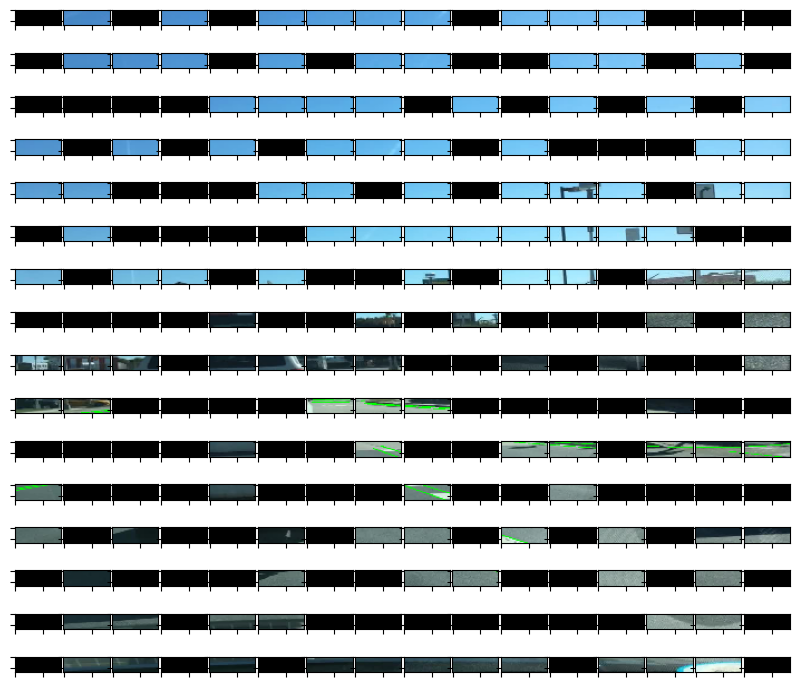

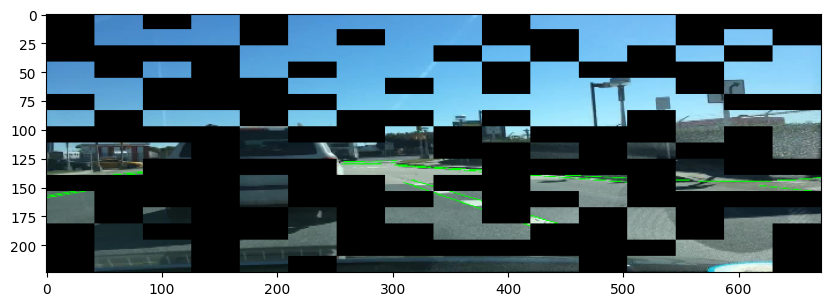

In [22]:
def mask_visualizer(img_path, mask_path, target_sz, mask_sz, mask_ratio, data_mode='culane'):
    img = Image.open(img_path)
    mask = Image.open(mask_path)
    
    img = apply_mask_on_image(img, mask, mode=data_mode)
    
    if data_mode=='bdd':
        mask = mask.convert('RGB')
    
    img_downscaler = A.Compose([A.Resize(target_sz[0], target_sz[1])])
    
    img = np.array(img)
    mask = np.array(mask) # (H, W, C) format
    
    if data_mode in ['llamas', 'bdd', 'tusimple']:
        # below returns (H, W)
        mask = np.max(mask, axis=2) # channel-wise max operation makes the same format as culane mask format
    
    transforms = img_downscaler(image=img, mask=mask)
    img = transforms['image']
    mask = transforms['mask']
    
    H, W, C = img.shape
    N = H//mask_sz[0] * W//mask_sz[1]
    
    img = torch.tensor(img) # convert to image tensor
    mask = torch.tensor(mask) # convert to mask tensor
    
    print("image shape: ", img.shape)
    
    patched_img = patch_masking(img, mask_sz, mask_ratio)
    
    plt.figure(figsize=(10, 10))
    masked_img = torch.reshape(patched_img, (H//mask_sz[0], W//mask_sz[1], mask_sz[0], mask_sz[1], C)).swapaxes(1, 2)
    masked_img = torch.reshape(masked_img, (H, W, C))
        
    return patched_img, masked_img


def patch_masking(image, mask_sz, mask_ratio):
    H, W, C = image.shape
    N = H//mask_sz[0] * W//mask_sz[1]
    
    img_patched = torch.reshape(image, (H//mask_sz[0], mask_sz[0], W//mask_sz[1], mask_sz[1], C))
    img_patched = img_patched.swapaxes(1, 2).reshape(-1, mask_sz[0], mask_sz[1], C) # (B, S, D)
    
    random_keys = torch.randperm(N)
    _, restore_keys = torch.sort(random_keys)
    
    img_patched = torch.index_select(img_patched, dim=0, index=random_keys)
    img_patched[:int(N*mask_ratio), :, :, :] = 0
    img_patched = torch.index_select(img_patched, dim=0, index=restore_keys)
    
    print("patched image shape: ", img_patched.shape)
    return img_patched

def visualize_patch(patched_img, img_sz):
    N, H, W, C = patched_img.shape
    
    for i in range(N):
        plt.subplot(img_sz[0]//H, img_sz[1]//W, i+1)
        plt.imshow(patched_img[i])
        plt.xticks(visible=False)
        plt.yticks(visible=False)
    plt.subplots_adjust(hspace=-0.65, wspace=0.05)

# patched_img, masked_img = mask_visualizer(cu_train_x[0], cu_train_y[0], (224, 672), (14, 42), 0.5, data_mode='culane')
# visualize_patch(patched_img, (224, 672))
# plt.figure(figsize=(10, 10))
# plt.imshow(masked_img)

# patched_img, masked_img = mask_visualizer(llamas_train_x[0], llamas_train_y[0], (224, 672), (14, 42), 0.5, data_mode='llamas')
# # visualize_patch(patched_img, (224, 672))
# plt.figure(figsize=(10, 10))
# plt.imshow(masked_img)

# patched_img, masked_img = mask_visualizer(tu_trainval_x[0], tu_trainval_y[0], (224, 672), (14, 42), 0.5, data_mode='tusimple')
# visualize_patch(patched_img, (224, 672))
# plt.figure(figsize=(10, 10))
# plt.imshow(masked_img)

patched_img, masked_img = mask_visualizer(bdd_train_x[10], bdd_train_y[10], (224, 672), (14, 42), 0.5, data_mode='bdd100k')
visualize_patch(patched_img, (224, 672))
plt.figure(figsize=(10, 10))
plt.imshow(masked_img)

image shape:  torch.Size([224, 672, 3])


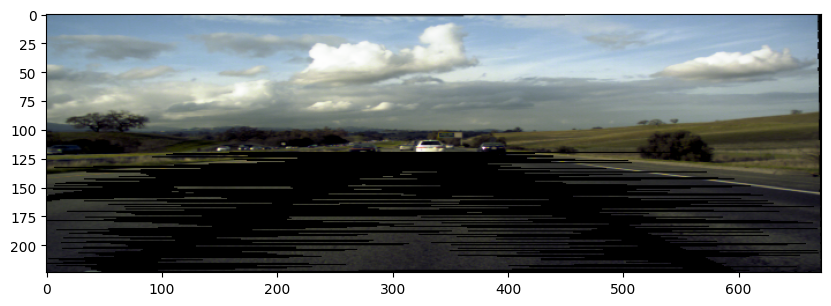

In [23]:
def mask_visualizer(img_path, mask_path, target_sz, data_mode='culane', masking_width=200):
    img = Image.open(img_path)
    mask = Image.open(mask_path)
    
    if data_mode=='bdd':
        mask = mask.convert('RGB') 
    
    img_downscaler = A.Compose([A.Resize(target_sz[0], target_sz[1])])
    
    img = np.array(img)
    mask = np.array(mask) # (H, W, C) format
    
    if data_mode in ['llamas', 'bdd', 'tusimple']:
        # below returns (H, W)
        mask = np.max(mask, axis=2) # channel-wise max operation makes the same format as culane mask format
    
    transforms = img_downscaler(image=img, mask=mask)
    img = transforms['image']
    mask = transforms['mask']
    
    img = torch.tensor(img) # convert to image tensor
    mask = torch.tensor(mask) # convert to mask tensor
    
    H, W, C = img.shape
    print("image shape: ", img.shape)
    
    masked_img = lane_masking(img, mask, masking_width)
    return masked_img

# masking_width are not applied constant qantity, rather it applies as stochastic range.
def lane_masking(image, masks, masking_width):
    H, W, C = image.shape
    random_noise = np.arange(masking_width) 
    skip_flag = False # flag for skip intialized as False
    
    if masking_width == 0:
        masking = masks!=0
        image[masking, :] = 0 # masking exactly where lanes are present
        return image
    
    for i in range(H):
        for j in range(W):
            if skip_flag:
                if masks[i, j]==0: # until background pixels re-appears
                    p_range = j + np.random.choice(random_noise)
                    if p_range < W: # must not exceed image boundary
                        masks[i, j:p_range] = -1 # -1 indicates it is masked and should not be considered as lanes
                    skip_flag=False # update skip_flag to False
                else:    
                    continue
                
            # when search finds non-background (lane pixels) it removes the horizontally left-part of the image with random range
            if masks[i, j] != 0 and masks[i,j]!=-1: # -1 cannot be interpreted as lanes
                m_range = j - np.random.choice(random_noise)
                if m_range >=0: # must not exceed image boundary
                    masks[i, m_range:j] = masks[i, j]
                    skip_flag = True # skip_flag on, skipping until background pixels appears in horizontal direction.
                    
    masking = masks!=0
    image[masking, :] = 0
    return image

# masked_img = mask_visualizer(cu_train_x[0], cu_train_y[0], (590, 1640), masking_width=200)
# masked_img = mask_visualizer(cu_train_x[0], cu_train_y[0], (224, 672), masking_width=200)
# masked_img = mask_visualizer(llamas_train_x[0], llamas_train_y[0], (717, 1276), data_mode='llamas', masking_width=200)
masked_img = mask_visualizer(llamas_train_x[0], llamas_train_y[0], (224, 672), data_mode='llamas', masking_width=200)
# masked_img = mask_visualizer(tu_trainval_x[0], tu_trainval_y[0], (720, 1280), data_mode='tusimple', masking_width=200)
# masked_img = mask_visualizer(tu_trainval_x[0], tu_trainval_y[0], (224, 672), data_mode='tusimple', masking_width=200)
# masked_img = mask_visualizer(bdd_train_x[10], bdd_train_y[10], (720, 1280), data_mode='bdd', masking_width=200)
# masked_img = mask_visualizer(bdd_train_x[10], bdd_train_y[10], (224, 672), data_mode='bdd', masking_width=200)

plt.figure(figsize=(10, 10))
plt.imshow(masked_img)

In [24]:
# Masked Autoencoders Are Scalable Vision Learners (https://arxiv.org/pdf/2111.06377)
# this applies smoothly with transformer settings but we can also apply this to CNN based models
# however, as ConvNeXt V2: Co-designing and Scaling ConvNets with Masked Autoencoders refer, directly applying it
# can degrade the performance of CNN based models. (how to predict using only mask patches are not clear)
class MaskedCULaneDataset(torch.utils.data.Dataset):
    def __init__(self, img_list, img_size, mask_window_size, mask_ratio):
        self.img_list = img_list
        self.img_size = img_size # default to (224, 672)
        self.mask_window_size = mask_window_size # (H, W) format
        self.mask_ratio = mask_ratio
        
        if img_size[0] % mask_window_size[0] !=0:
            raise Exception("height must be divisible by height of mask_window_size (H,W) format!")
        if img_size[1] % mask_window_size[1] != 0:
            raise Exception("width must be divisible by width of mask_window_size (H,W) format!")
        
        self.transforms = A.Compose([
            A.Resize(img_size[0], img_size[1]),
        ])
    
    def __len__(self):
        return len(self.img_list)
    
    # input: transformed (resized) images
    # output: masked images
    # this functions masks images randomly with given label ratio. masks are done in patch-wise manner 
    # and each patch is rectangular shape which its shape defined by mask_window_size parameter
    def _mask_images(self, transformed_images):
        H, W, C = transformed_images.shape
        transformed_images = torch.reshape(transformed_images, (H//self.mask_window_size[0], self.mask_window_size[0], 
                                                              W//self.mask_window_size[1], self.mask_window_size[1], C))
        transformed_images = transformed_images.swapaxes(1, 2).reshape(-1, self.mask_window_size[0], self.mask_window_size[1], C)
        N = H//self.mask_window_size[0] * W//self.mask_window_size[1] # (N, mask_window_size[0], mask_window_size[1], C)
        
        random_keys = torch.randperm(N)
        _, original_keys = torch.sort(random_keys) # get keys that keeps the original shuffle ordering
        
        transformed_images = torch.index_select(transformed_images, dim=0, index=random_keys) # random shuffle patches
        transformed_images[:int(N*self.mask_ratio), :, :] = 0 # masking
        masked_image = torch.index_select(transformed_images, dim=0, index=original_keys)
        
        masked_image = torch.reshape(masked_image, (H//self.mask_window_size[0], W//self.mask_window_size[1], self.mask_window_size[0],
                                                    self.mask_window_size[1], C)).swapaxes(1, 2)
        masked_image = torch.reshape(masked_image, (H, W, C)) # restore to original image shape
        
        return masked_image
        
    def __getitem__(self, idx):
        image = Image.open(self.img_list[idx]) # read image
        image = image.convert('RGB') # to ensure all image have 3 RGB channels format
        image = np.array(image)      # convert to numpy array
    
        transformed = self.transforms(image=image)
        image = transformed['image']
        
        image = image/255. # normalize image to 0~1 (simply divide it by 255)
        image = torch.tensor(image)
        label = image.clone() # copy the image tensors
        
        masked_image = self._mask_images(image)
        masked_image = masked_image.permute(2, 0, 1) # change to chanel first format
        label = label.permute(2, 0, 1) # change to channel first format
        
        return masked_image.float(), label.float() # last convert to float type tensor


# in this case, the task is to predict the pixel values of the lane-masked images. (but the loss will be calculated with whole image pixel values)
class LaneMaskedCULaneDataset(torch.utils.data.Dataset):
    def __init__(self, img_list, mask_list, img_size, masking_width):
        self.img_list = img_list
        self.mask_list = mask_list
        self.img_size = img_size
        self.masking_width = masking_width # width of masking that expands horizontally to lane masks
        self.transforms = A.Compose([
            A.Resize(img_size[0], img_size[1]),
        ])
    
    def __len__(self):
        return len(self.img_list)
    
    def _mask_lanes(self, transformed_images, masks):
        transformed_images[masks!=0, :] = 0 # masking lane markings
        
        return transformed_images
    
    # masking_width are not applied constant qantity, rather it applies as stochastic range.
    def _mask_lanes_w(self, image, masks):
        H, W, C = image.shape
        random_noise = np.arange(self.masking_width) 
        skip_flag = False # flag for skip intialized as False
        
        for i in range(H):
            for j in range(W):
                if skip_flag:
                    if masks[i, j]==0: # until background pixels re-appears
                        p_range = j + np.random.choice(random_noise)
                        if p_range < W: # must not exceed image boundary
                            masks[i, j:p_range] = 10 # 10 indicates it is masked and should not be considered as lanes
                        skip_flag=False # update skip_flag to False
                    else:    
                        continue
                    
                # when search finds non-background (lane pixels) it removes the horizontally left-part of the image with random range
                if masks[i, j] != 0 and masks[i,j]!=10: # -1 cannot be interpreted as lanes
                    m_range = j - np.random.choice(random_noise)
                    if m_range >=0: # must not exceed image boundary
                        masks[i, m_range:j] = masks[i, j]
                        skip_flag = True # skip_flag on, skipping until background pixels appears in horizontal direction.
                        
        masking = masks!=0
        image[masking, :] = 0
        return image
    
    def __getitem__(self, idx):
        image = Image.open(self.img_list[idx])
        lane_mask = Image.open(self.mask_list[idx])
        
        image = image.convert('RGB')
        
        image = np.array(image)
        lane_mask = np.array(lane_mask)
        
        transformed = self.transforms(image=image, mask=lane_mask) # transforms both image and mask to specific size
        image = transformed['image']
        lane_mask = transformed['mask']
        
        image = image/255. # images are simply normalized by dividing by 255
        image = torch.tensor(image)
        
        label = image.clone() # original non-masked images are used as labels
        label = label.permute(2, 0, 1) # convert to channel first format
        
        if self.masking_width == 0:
            masked_image = self._mask_lanes(image, lane_mask)
        else:
            masked_image = self._mask_lanes_w(image, lane_mask)
        masked_image = masked_image.permute(2, 0, 1) # convert to channel first format
        return masked_image.float(), label.float()

# Masked Unsupervised Dataset for multi-dataset (culane, bdd100k, tusimple, llamas)
# order of each parameter list must be matched with the each dataset you want to use
# in case of using convnext model, img size must be fixed because of layer_norm operation.
class MaskedMultiDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict:dict, img_size:list, target_size:list, mask_window_size:list, mask_ratio:float):
        self.data_dict = data_dict # dictionary that matches name of dataset and images
        self.img_size = img_size # img_size is given as list, indicating multi-scale, multi-ratio pre-training is possible.
        self.target_size = target_size # usually output from model must be same as input, but it can be different for some cases
        self.mask_window_size = mask_window_size
        self.mask_ratio = mask_ratio
        
        # check if each given img_size is divisible by mask_window_size
        for i, size in enumerate(img_size, 0):
            if size[0] % mask_window_size[i][0] != 0:
                raise Exception("height must be divisible by height of mask_window_size")
            if size[1] % mask_window_size[i][1] != 0:
                raise Exception("width must be divisible by width of mask_window_size")
        
        # note that each image from different dataset must be restored by decoder as same size for each dataset
        self.size_transforms = []
        for size in img_size:
            self.size_transforms.append(A.Compose([
                A.Resize(size[0], size[1]),
            ]))
        
        self.mask_size_transforms = []
        for size in target_size:
            self.mask_size_transforms.append(A.Compose([
                A.Resize(size[0], size[1]),
            ]))
        
        # mapper which dataset name corresponds to mask_window size, size_transforms (just simply following sequential order)
        self.indicators = {k:i for i, k in enumerate(data_dict.keys(), 0)}
        
        self.datasets = []
        for key, value in self.data_dict.items():
            for img_path in value:
                self.datasets.append((img_path, key)) # key must be present to indicate which image belongs to which dataset

    def __len__(self):
        num_of_imgs = sum([len(v) for v in self.data_dict.values()]) # total number of imgs contained in the given dictionary
        return num_of_imgs
    
    # input: transformed (resized) images
    # output: masked images
    # this functions masks images randomly with given label ratio. masks are done in patch-wise manner 
    # and each patch is rectangular shape which its shape defined by mask_window_size parameter
    def _mask_images(self, transformed_images, key):
        H, W, C = transformed_images.shape
        mask_window_h = self.mask_window_size[self.indicators[key]][0]
        mask_window_w = self.mask_window_size[self.indicators[key]][1]
        
        transformed_images = torch.reshape(transformed_images, (H//mask_window_h, mask_window_h, 
                                                              W//mask_window_w, mask_window_w, C))
        transformed_images = transformed_images.swapaxes(1, 2).reshape(-1, mask_window_h, mask_window_w, C)
        N = H//mask_window_h * W//mask_window_w # (N, mask_window_h, mask_window_w, C)
        
        random_keys = torch.randperm(N)
        _, original_keys = torch.sort(random_keys) # get keys that keeps the original shuffle ordering
        
        transformed_images = torch.index_select(transformed_images, dim=0, index=random_keys) # random shuffle patches
        transformed_images[:int(N*self.mask_ratio), :, :] = 0 # masking
        masked_image = torch.index_select(transformed_images, dim=0, index=original_keys)
        
        masked_image = torch.reshape(masked_image, (H//mask_window_h, W//mask_window_w, mask_window_h,
                                                    mask_window_w, C)).swapaxes(1, 2)
        masked_image = torch.reshape(masked_image, (H, W, C)) # restore to original image shape
        return masked_image
    
    def __getitem__(self, idx):
        path, key = self.datasets[idx]
        image = Image.open(path) # read image
        image = image.convert('RGB') # to ensure all image have 3 RGB channels format
        image = np.array(image)      # convert to numpy array
        label = np.copy(image)       # copy original image for labels
    
        transformed = self.size_transforms[self.indicators[key]](image=image)
        image = transformed['image']
        
        transformed_mask = self.mask_size_transforms[self.indicators[key]](image=label)
        label = transformed_mask['image']
        
        image = image/255. # normalize image to 0~1 (simply divide it by 255)
        label = label/255.
        
        image = torch.tensor(image)
        label = torch.tensor(label)
        
        masked_image = self._mask_images(image, key)
        masked_image = masked_image.permute(2, 0, 1) # change to chanel first format
        label = label.permute(2, 0, 1) # change to channel first format
        
        return masked_image.float(), label.float() # last convert to float type tensor

# Lane centered masked supervised dataset for multi-dataset (culane, bdd100k, tusimple, llamas)
class LaneMaskedMultiDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict:dict, mask_dict:dict, img_size:list, target_size:list, masking_width:int):    
        self.data_dict = data_dict
        self.mask_dict = mask_dict
        self.img_size = img_size
        self.target_size = target_size
        self.masking_width = masking_width
        
        self.size_transforms = []
        for size in img_size:
            self.size_transforms.append(A.Compose([
                A.Resize(size[0], size[1]), # H, W format
            ]))
        
        self.mask_size_transforms = []
        for size in target_size:
            self.mask_size_transforms.append(A.Compose([
                A.Resize(size[0], size[1]) # H, W format
            ]))
        
        self.indicators = {k:i for i, k in enumerate(data_dict.keys(), 0)}
        
        self.datasets = []
        self.masks = []
        for key, value in self.data_dict.items():
            for path in value:
                self.datasets.append((path, key))
        for key, value in self.mask_dict.items():
            for path in value:
                self.masks.append((path, key))
    
    def __len__(self):
        num_of_imgs = sum([len(v) for v in self.data_dict.values()]) # total number of imgs contained in the given dictionary
        return num_of_imgs
    
    def _mask_lanes(self, transformed_images, masks):
        transformed_images[masks!=0, :] = 0 # masking lane markings
        return transformed_images
    
    # masking_width are not applied constant qantity, rather it applies as stochastic range.
    def _mask_lanes_w(self, image, masks):
        H, W, C = image.shape
        random_noise = np.arange(self.masking_width) 
        skip_flag = False # flag for skip intialized as False
        
        for i in range(H):
            for j in range(W):
                if skip_flag:
                    if masks[i, j]==0: # until background pixels re-appears
                        p_range = j + np.random.choice(random_noise)
                        if p_range < W: # must not exceed image boundary
                            masks[i, j:p_range] = 255 # 255 indicates it is masked and should not be considered as lanes
                        skip_flag=False # update skip_flag to False
                    else:    
                        continue
                    
                # when search finds non-background (lane pixels) it removes the horizontally left-part of the image with random range
                if masks[i, j] != 0 and masks[i,j]!=255: # 255 cannot be interpreted as lanes
                    m_range = j - np.random.choice(random_noise)
                    if m_range >=0: # must not exceed image boundary
                        masks[i, m_range:j] = masks[i, j]
                        skip_flag = True # skip_flag on, skipping until background pixels appears in horizontal direction.
                        
        masking = masks!=0
        image[masking, :] = 0
        return image
    
    def __getitem__(self, idx):
        img_path, key = self.datasets[idx]
        mask_path, _ = self.masks[idx]
        
        image = Image.open(img_path)
        image = image.convert('RGB')
        lane_mask = Image.open(mask_path)
        
        # in case of bdd100k (in case of /color_maps folder labels instead of /masks) convert to RGB format ensures background informations are added. (H, W, C)
        # if you use bdd100k (masks labels), you just get (H, W) format, where pixel value 255 indicates background information, other values indicates various lane markings.
        if key=='bdd':
            lane_mask = lane_mask.convert('RGB') 
        
        image = np.array(image)
        lane_mask = np.array(lane_mask)
        label = np.copy(image) # copy image before convert to label
        
        # as we will treat culane mask as standard, we will process only llamas and tusimple, bdd dataset
        # culane format : (H, W) where each pixel value indicates lane+background information (0:background, 1~: lane)
        if key in ['llamas', 'bdd', 'tusimple']:
            lane_mask = np.max(lane_mask, axis=2) # channel-wise max operation makes the same format as culane mask format
            
        # input image and lane_mask must have same size
        transformed = self.size_transforms[self.indicators[key]](image=image, mask=lane_mask) # transforms both image and mask to specific size
        image = transformed['image']
        lane_mask = transformed['mask']
        
        # images are simply normalized by dividing by 255
        image = image/255.
        
        # transform label image to target_size
        transformed_label = self.mask_size_transforms[self.indicators[key]](image=label)
        label = transformed_label['image']
        label = label/255.
        
        image = torch.tensor(image)
        label = torch.tensor(label)
        label = label.permute(2, 0, 1) # convert to channel first format
        
        if self.masking_width == 0:
            masked_image = self._mask_lanes(image, lane_mask)
        else:
            masked_image = self._mask_lanes_w(image, lane_mask)
        masked_image = masked_image.permute(2, 0, 1) # convert to channel first format

        return masked_image.float(), label.float()

##### CULane Data Training

In [25]:
# this case is for unsupervised masked learning where the task is to predict the pixel values of patch-wise masked images.
# in this case, test dataset will be used for training except culane where we use for benchmarking our model.
# train_dataset = MaskedCULaneDataset(unsuper_train_x['culane'], img_size=(224, 672), mask_window_size=(56, 168), mask_ratio=0.5)
# val_dataset = MaskedCULaneDataset(unsuper_val_x['culane'], img_size=(224, 672), mask_window_size=(56, 168), mask_ratio=0.5)

# batch_size=32
# train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

# this case is for self-supervised learning where the task is to predict the pixel values of lane centered-masked images.
# only train and validation data of culane will be used, in order not to leak information to training set
# train_dataset = LaneMaskedCULaneDataset(super_train_x['culane'], super_train_y['culane'], img_size= (224, 672), masking_width=200)
# val_dataset = LaneMaskedCULaneDataset(super_val_x['culane'], super_val_y['culane'], img_size=(224, 672), masking_width=100)

# batch_size = 32
# train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

# print(f"number of iterations by batch_size {batch_size}: ", len(train_dataloader))
# print(f"number of val iterations by batch_size {batch_size}: ", len(val_dataloader))

##### Multi-Data Training

In [26]:
# train_dataset = MaskedMultiDataset(unsuper_train_x, img_size=[(224, 672)]*4, target_size=[(224, 672)]*4, mask_window_size=[(28, 84)]*4, mask_ratio=0.5)
# val_dataset = MaskedMultiDataset(unsuper_val_x, img_size=[(224, 672)]*4, target_size=[(224, 672)]*4, mask_window_size=[(28, 84)]*4, mask_ratio=0.5)

# # total number of images for training: 261704
# # total number of val images: 43301
# batch_size = 1
# train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

train_dataset = LaneMaskedMultiDataset(super_train_x, super_train_y, img_size=[(224, 672)]*4, target_size=[(224, 672)]*4, masking_width=200)
val_dataset = LaneMaskedMultiDataset(super_val_x, super_val_y, img_size=[(224, 672)]*4, target_size=[(224, 672)]*4, masking_width=200)

# total number of images for traing: 220775
# toal number of val images: 43301
batch_size = 32
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

print(f"number of iterations by batch_size {batch_size}: ", len(train_dataloader))
print(f"number of val iterations by batch_size {batch_size}: ", len(val_dataloader))

number of iterations by batch_size 32:  6900
number of val iterations by batch_size 32:  1354


In [27]:
LR=0.001
LR_MIN=1e-5
EPOCHS=100
DECAY=0.5
MUL=1.0
LIMIT=100
WARMUP=5
WARMUP_INIT=0.00001
STEP_SIZE=50

# image: (B, C, H, W) format, model output
# label: (B, C, H, W) normalized original image (not masked)
# mask_location:  (B, H, W) format, directly obtained from output of dataloader when all channels values are zero,
# this function can be used both for unsupervised, self-supervised methods
def get_masked_pixel_reconstruction(image, label, mask_location):
    # since shape of mask_location location and image, label is same, output tensor is flatten number
    mask_location = mask_location.unsqueeze(1).expand(-1, image.shape[1], -1, -1) # add channel dimension and expand dimension of channel to match with image, label
    
    masked_output = image[mask_location]
    masked_label = label[mask_location] 
    masked_pixel_reconstruction = ((masked_output - masked_label)**2).mean()
    return masked_pixel_reconstruction

# this functions returns mse values of between model output and label (normalized original image)
def get_pixel_reconstruction(image, label):
    pixel_reconstruction = ((image-label)**2).mean()
    return pixel_reconstruction

# this loss return only masked pixel reconstruction loss
class PixelReconstructLoss(torch.nn.Module):
    def __init__(self, ):
        super(PixelReconstructLoss, self).__init__()
    
    def forward(self, image, label, mask_location):
        
        mask_location = mask_location.unsqueeze(1).expand(-1, image.shape[1], -1, -1)
        
        masked_output = image[mask_location]
        masked_label = label[mask_location]
        masked_pixel_reconstruct = ((masked_output - masked_label)**2).mean()
        return masked_pixel_reconstruct

optimizer = torch.optim.AdamW(convnext_unet.parameters(), lr=LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=0.01)
# criterion = torch.nn.MSELoss() # dice loss
criterion = PixelReconstructLoss()
scheduler = timm.scheduler.cosine_lr.CosineLRScheduler(optimizer, t_initial=STEP_SIZE, lr_min=LR_MIN, cycle_mul=MUL, cycle_decay=DECAY,
                                                    cycle_limit=LIMIT, warmup_t=WARMUP, warmup_lr_init=WARMUP_INIT)

In [23]:
# create directories if not exist
def checkdir(path):
    if not os.path.exists(path):
        print("creating directories: ", path)
        os.makedirs(path)

currtime = (datetime.datetime.utcnow() + datetime.timedelta(hours=9)).strftime("%Y_%m_%d_%H%M%S") # need to plus 9 hours to utc time (ktz=utc+9)

weight_dir = '/work/checkpoints'
plot_dir = '/work/plots'
project_name = f'convnext_unet/multi_data/unsupervised/{currtime}'
save_path = weight_dir + '/' + project_name
save_plot_path = plot_dir + '/' + project_name
save_step = 10 # save model weights per 10 epochs
save_plot_step = 5 # save plots per 5 epochs

checkdir(save_path)
checkdir(save_plot_path)

# copying files for saving experiments
os.system(f'cp /work/model/backbone/convnext_se/convnext_se.py {save_path}/convnext_se.py')
os.system(f'cp /work/model/head/convnext_se_unet.py {save_path}/convnext_se_unet.py')
os.system(f'cp /work/train/CULane/unsupervised/pixel_reconstruction/train_unsupervised.ipynb {save_path}/train_unsupervised.ipynb')


train_history = []
val_history = []
lr_history = []

train_reconst_history = []
val_reconst_history = []

train_num_prints = 100
val_num_prints = 10

total_train_iter = len(train_dataloader)
total_val_iter = len(val_dataloader)

print_threshold = int(total_train_iter/train_num_prints)
val_print_threshold = int(total_val_iter/val_num_prints)

start_epoch = 0
end_epoch = 100

convnext_unet = convnext_unet.to('cuda')

# checkpoint file loadings
# checkpoint_fname = ""
# load_path = save_path + '/weights' + checkpoint_fname
# checkpoints = torch.load(load_path)
# # filtering weight name 'module.' on checkpoint file name
# for key in list(checkpoints['model_state_dict'].keys()):
#     if 'module.' in key:
#         checkpoints['model_state_dict'][key.replace('module.', '')] = checkpoints['model_state_dict'][key]
#         del checkpoints['model_state_dict'][key]
# convnext_unet.load_state_dict(checkpoint['model_state_dict'])
# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
# scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

torch.backends.cudnn.enabled=True
torch.backends.cudnn.benchmark=True

# start training
for epoch in range(start_epoch, end_epoch): # epochs follows 0-index ordering
    convnext_unet.train()
    
    running_loss = 0.0
    running_pixel_reconst = 0.0
    loss_container = []
    pixel_reconstruction_container = []
    for i, batch in enumerate(train_dataloader, 1): # batch, i follows 1-index ordering
        optimizer.zero_grad()
        
        image, mask = batch
        image = image.to('cuda')
        mask = mask.to('cuda')
        
        masked_location = (image==0).all(dim=1) # (B, C, H, W) -> channel-wisely when all pixel-values are zero, the pixel is masked.
        
        prediction_mask = convnext_unet(image)
        loss = criterion(prediction_mask, mask, masked_location)
        
        loss.backward() 
        optimizer.step()
        
        pixel_reconstruction = get_masked_pixel_reconstruction(prediction_mask, mask, masked_location)
        loss_container.append(loss.detach().item())
        pixel_reconstruction_container.append(pixel_reconstruction.detach())
        running_loss += loss.detach().item()
        running_pixel_reconst += pixel_reconstruction.detach()
        
        if i % print_threshold == 0:
            print(f"training [{epoch+1}:{i:5d}/{total_train_iter}] loss: {running_loss/print_threshold:.3f} pixel reconstruction: {running_pixel_reconst/print_threshold:.3f}, lr: {optimizer.param_groups[0]['lr']}")
            running_loss = 0.0
            running_pixel_reconst = 0.0
        
    loss = np.mean(loss_container)
    pixel_reconstruction = np.mean(pixel_reconstruction_container)
    train_history.append(loss)
    train_reconst_history.append(pixel_reconstruction)
    lr_history.append(optimizer.param_groups[0]['lr'])
    
    print("="*50)
    print(f"Train Epoch: {epoch+1}, Loss: {loss:.3f}, Pixel Reconstruction: {pixel_reconstruction:.3f}, LR: {optimizer.param_groups[0]['lr']}")
    print("="*50)
    
    convnext_unet.eval()
    running_loss = 0.0
    running_pixel_reconst = 0.0
    loss_container = []
    pixel_reconstruction_container = []
    with torch.no_grad():
        for i, batch in enumerate(val_dataloader, 1):
            image, mask = batch
            image = image.to('cuda')
            mask = mask.to('cuda')
            
            masked_location = (image==0).all(dim=1) # (B, C, H, W)
            prediction_mask = convnext_unet(image)
            loss = criterion(prediction_mask, mask, masked_location)
            
            loss_container.append(loss.detach().item())
            running_loss += loss.detach().item()
            
            pixel_reconstruction = get_masked_pixel_reconstruction(prediction_mask, mask, masked_location)
            running_pixel_reconst += pixel_reconstruction.detach()
            
            
            if i % val_print_threshold == 0:
                print(f"Validation [{epoch+1}:{i:5d}/{total_val_iter}] loss: {running_loss/val_print_threshold:.3f} pixel reconstruction: {running_pixel_reconst/val_print_threshold:.3f}")
                running_loss = 0.0
                running_pixel_reconst = 0.0
    
    loss = np.mean(loss_container)
    val_history.append(loss)
    pixel_reconstruction = np.mean(pixel_reconstruction_container)
    val_reconst_history.append(pixel_reconstruction)
    
    print("="*50)
    print(f"Val Epoch: {epoch+1}, Loss: {loss:.3f}, Pixel Reconstruction: {pixel_reconstruction:.3f}, LR: {optimizer.param_groups[0]['lr']}")
    print("="*50)
    

    # update scheduler
    scheduler.step(epoch)
    
    checkdir(save_path+'/weights')
    if ((epoch+1) % save_step) == 0 or (epoch+1)==end_epoch:
        print("+"*50)
        print(f"Saving Model to {save_path}/weights...")
        print("+"*50)
        
        currtime = (datetime.datetime.utcnow() + datetime.timedelta(hours=9)).strftime("%Y_%m_%d_%H%M%S")
        torch.save({
            'epoch': epoch,
            'model_state_dict' : convnext_unet.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict' : scheduler.state_dict(),
        }, f'{save_path}/weights/{currtime}_epoch{epoch+1}.pth') # epochs are saved as 1-index ordering (index 0 means initial state)
        
    
    if ((epoch+1) % save_plot_step) == 0 or (epoch+1)==end_epoch:
        checkdir(save_plot_path)
        checkdir(save_plot_path+'/loss')
        checkdir(save_plot_path+'/lr')
        checkdir(save_plot_path+'/reconst')
        
        try:
            tick_step = 1
            # plot mse loss (pixel reconstruction with whole image pair)
            plt.figure(figsize=(12, 8))
            plt.title('Training and Validation Loss')
            plt.plot(range(len(train_history)), train_history, label='train loss')
            plt.plot(range(len(val_history)), val_history, label='val loss')
            plt.xticks(range(0, len(train_history)+1, tick_step))
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()
            plt.savefig(f'{save_plot_path}/loss/{epoch}.png')
            
            # plot masked mse loss (pixel reconstruction loss with only masked locations)
            plt.figure(figsize=(12, 8))
            plt.title('Training and Validation Pixel Reconstruction Loss')
            plt.plot(range(len(train_reconst_history)), train_reconst_history, label='train reconstruction loss')
            plt.plot(range(len(val_reconst_history)), val_reconst_history, label='val reconstruction loss')
            plt.xticks(range(0, len(train_reconst_history)+1, tick_step))
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()
            plt.savefig(f'{save_plot_path}/reconst/{epoch}.png')
            
            # plot lr
            plt.figure(figsize=(12, 8))
            plt.title('Learning Rate')
            plt.plot(range(len(lr_history)), lr_history, label='learning rate')
            plt.xticks(range(0, len(lr_history), tick_step))
            plt.xlabel('Epochs')
            plt.ylabel('LR')
            plt.legend()
            plt.savefig(f'{save_plot_path}/lr/{epoch}.png')
            
            # need to close all plots to save memory
            plt.close('all')
        except:
            print("[Error]: Error while saving plots.....")

creating directories:  /work/checkpoints/convnext_unet/multi_data/unsupervised/2025_02_14_140934
creating directories:  /work/plots/convnext_unet/multi_data/unsupervised/2025_02_14_140934
training [1:   69/6900] loss: 0.124 pixel reconstruction: 0.124, lr: 1e-05
training [1:  138/6900] loss: 0.044 pixel reconstruction: 0.044, lr: 1e-05
training [1:  207/6900] loss: 0.034 pixel reconstruction: 0.034, lr: 1e-05
training [1:  276/6900] loss: 0.033 pixel reconstruction: 0.033, lr: 1e-05
training [1:  345/6900] loss: 0.031 pixel reconstruction: 0.031, lr: 1e-05
training [1:  414/6900] loss: 0.030 pixel reconstruction: 0.030, lr: 1e-05
training [1:  483/6900] loss: 0.029 pixel reconstruction: 0.029, lr: 1e-05
training [1:  552/6900] loss: 0.028 pixel reconstruction: 0.028, lr: 1e-05
training [1:  621/6900] loss: 0.027 pixel reconstruction: 0.027, lr: 1e-05
training [1:  690/6900] loss: 0.026 pixel reconstruction: 0.026, lr: 1e-05
training [1:  759/6900] loss: 0.025 pixel reconstruction: 0.02

KeyboardInterrupt: 

#### Inferece: Model Pixel Reconstruction Quality Check

In [38]:
# path ='/work/checkpoints/convnext_unet_4x/culane/self_supervised/2025_02_11_182054/weights/2025_02_12_163433_epoch20.pth'
# path ='/work/checkpoints/convnext_unet_4x/multi_data/self_supervised/2025_02_17_150135/weights/2025_02_21_125701_epoch30.pth'
path ='/work/checkpoints/convnext_unet_4x/multi_data/self_supervised/2025_02_17_150135/weights/2025_02_22_202021_epoch40.pth'


checkpoints = torch.load(path)
# filtering weight name 'module.' on checkpoint file name (if not using torch.distributed training, 'module.' on key string need to be filtered.)
for key in list(checkpoints['model_state_dict'].keys()):
    if 'module.' in key:
        checkpoints['model_state_dict'][key.replace('module.', '')] = checkpoints['model_state_dict'][key]
        del checkpoints['model_state_dict'][key]
convnext_unet.load_state_dict(checkpoints['model_state_dict'])

<All keys matched successfully>

In [41]:
for key in checkpoints['model_state_dict'].keys():
    print("key: ", key)

key:  encoder.stem.stem_conv.weight
key:  encoder.stem.stem_conv.bias
key:  encoder.stages.0.blocks.0.depthwisesep_conv.depthwise_conv.weight
key:  encoder.stages.0.blocks.0.depthwisesep_conv.depthwise_conv.bias
key:  encoder.stages.0.blocks.0.depthwisesep_conv.pointwise_conv.weight
key:  encoder.stages.0.blocks.0.depthwisesep_conv.pointwise_conv.bias
key:  encoder.stages.0.blocks.0.pointwise_1.weight
key:  encoder.stages.0.blocks.0.pointwise_1.bias
key:  encoder.stages.0.blocks.0.pointwise_2.weight
key:  encoder.stages.0.blocks.0.pointwise_2.bias
key:  encoder.stages.0.blocks.0.fc1.weight
key:  encoder.stages.0.blocks.0.fc1.bias
key:  encoder.stages.0.blocks.0.fc2.weight
key:  encoder.stages.0.blocks.0.fc2.bias
key:  encoder.stages.0.blocks.0.normalization.weight
key:  encoder.stages.0.blocks.0.normalization.bias
key:  encoder.stages.0.blocks.1.depthwisesep_conv.depthwise_conv.weight
key:  encoder.stages.0.blocks.1.depthwisesep_conv.depthwise_conv.bias
key:  encoder.stages.0.blocks.1.

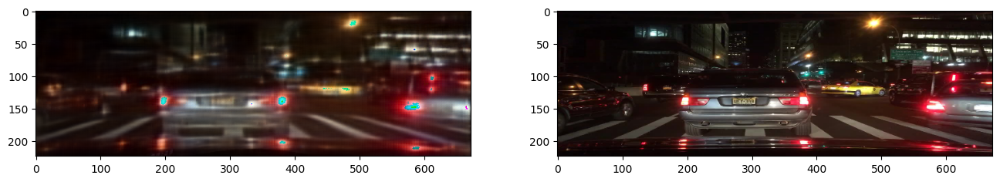

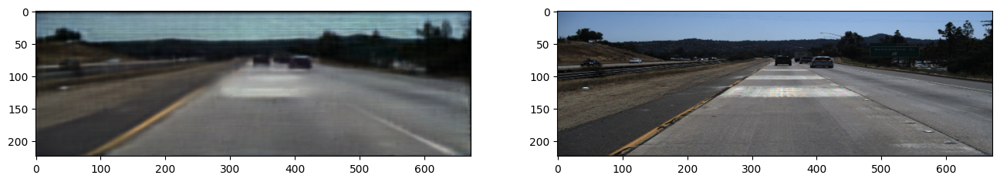

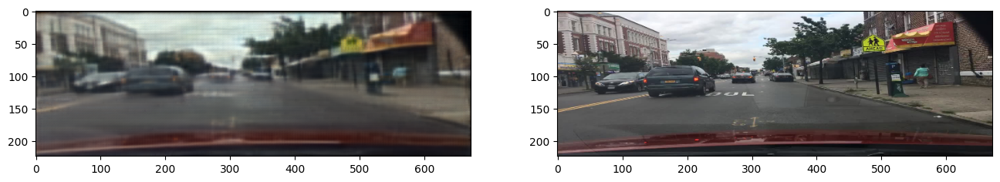

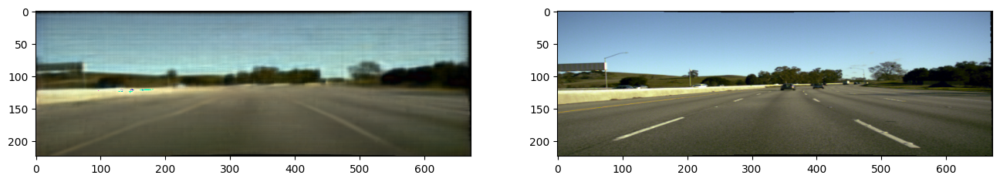

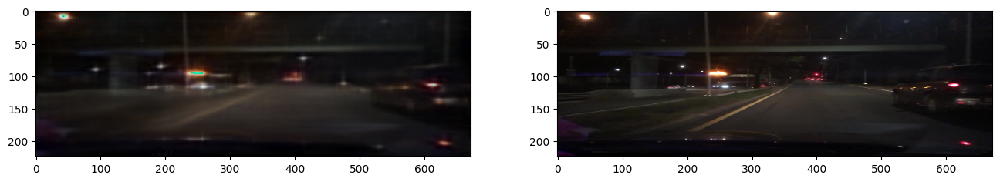

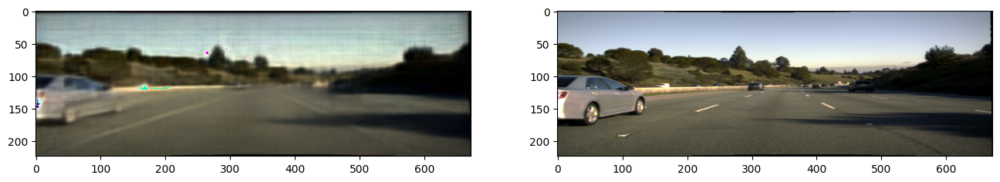

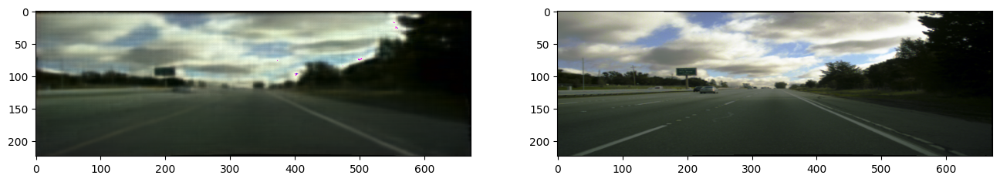

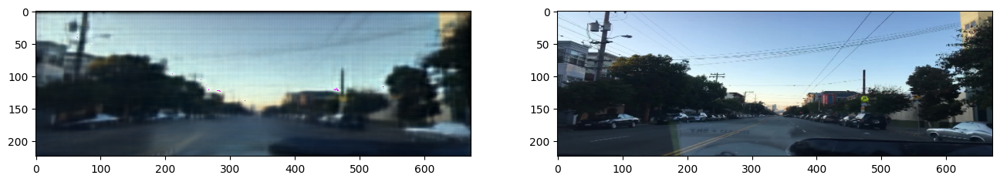

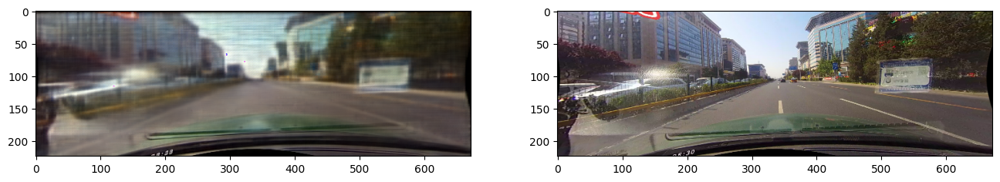

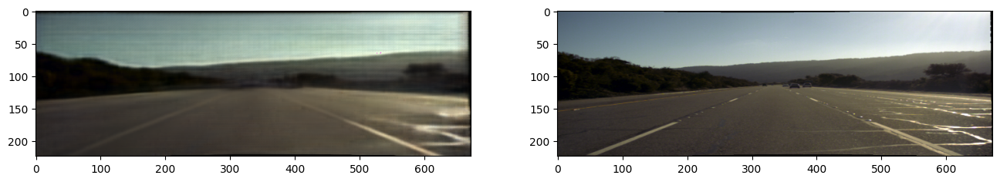

In [26]:
# visualize the result
def visualize_mask(model, val_dataloader, vis_counts, device='cuda'):
    
    model = model.to(device)
    counts = 0
    exit_flag = False
    model.eval()
    
    for batch in val_dataloader: # 32 examples per one batch
        image, label = batch # (B, C, H, W)
        
        # (B, H, W, C)
        vis_img = image.permute(0, 2, 3, 1).detach().numpy() # convert to channel-last form
        label_img = label.permute(0, 2, 3, 1).detach().numpy()
        reconstructed_img = model(image).detach().permute(0, 2, 3, 1).numpy() 
        
        B = vis_img.shape[0]
        for i in range(B):
            plt.figure(figsize=(16, 8))
            plt.subplot(1, 2, 1)
            plt.imshow((np.abs(reconstructed_img[i, :, :, :]) * 255).astype(np.uint8))
            plt.subplot(1, 2, 2)
            plt.imshow((label_img[i, :, :, :] * 255).astype(np.uint8))

            counts+= 1
            
            if counts >= vis_counts:
                exit_flag = True # when number of output images are more than vis_counts, exit the iterations
                break
        
        if exit_flag:
            break

visualize_mask(convnext_unet, val_dataloader, 10, device='cpu')